In [21]:
%matplotlib inline
#%matplotlib notebook
import numpy as np
from matplotlib import pyplot as plt

import time
import csv
import h5py
from keras.layers.core import Dense, Activation, Dropout, Flatten
from keras.layers import BatchNormalization, Reshape, UpSampling2D, Conv2DTranspose, LeakyReLU, ZeroPadding2D, Input, MaxPooling2D
from keras.layers.convolutional import Conv2D
from keras.layers.recurrent import LSTM, GRU
from keras.models import Sequential, load_model, Model
from keras import regularizers, optimizers, initializers, constraints
from keras.optimizers import RMSprop, Adam
from keras.engine import InputSpec, Layer, InputLayer
np.random.seed(1234)
from keras.utils import plot_model
import keras.backend.tensorflow_backend as Kback
from IPython.display import clear_output
import keras as K
import tensorflow as tf
import scipy.io as sio
from scipy import stats
import scipy as scp
import scipy.misc
from scipy.signal import resample
import keras
from keras.backend.tensorflow_backend import set_session
import os
import random
import time
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]='1'
config=tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction=1
set_session(tf.Session(config=config))

In [2]:
#Load data
f = h5py.File('cropped.mat')

In [3]:
#input_parameters
hrz = 128
vrt = 128
x_train = {}

x_train = f['bigdata'][()]
print(x_train.shape)
x_train_small_pre = np.ndarray((x_train.shape[3],hrz,vrt,3),int)
x_train_small = np.ndarray((x_train.shape[3],hrz,vrt,3),int)
x_train_s = np.swapaxes(x_train,0,3)
x_train_s = np.swapaxes(x_train_s,1,2)
print(x_train_s.shape)

(3, 210, 165, 13775)
(13775, 165, 210, 3)


In [4]:
for j in range(0,x_train_s.shape[0]):
    pic = scp.misc.imresize(x_train_s[j,:,:,:],(hrz,vrt,3))
    x_train_small_pre[j,:,:,:] = pic 
#x_train_small_pre = x_train_s
print(pic[1,1,1])

/usr/local/lib/python3.4/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  


132


In [5]:
print(x_train_small_pre.shape)
x_train_small_pre = np.random.permutation(x_train_small_pre)
print(x_train_small_pre.shape)

(13775, 128, 128, 3)
(13775, 128, 128, 3)


(128, 128, 3)
166


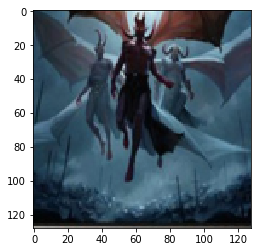

In [6]:
probe = 1
testpic = x_train_small_pre[probe,:,:,:]
print(testpic.shape)
plt.imshow(testpic.astype(np.uint8))
print(max(testpic[:,0,0]))

max: 0.4843137254901961
min: -0.49607843137254903
similarity: 0.7992008184295853
max: 251.0
min: 1.0


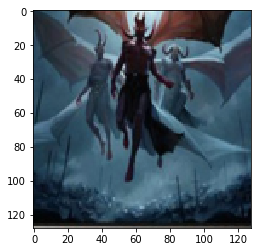

In [8]:
x_train_small = (x_train_small_pre-127.5)/255
#x_train_small = x_train_small_pre/255

testpic_sml = x_train_small[probe,:,:,:]
print("max:",np.amax(testpic_sml[:,:,2]))
print("min:",np.amin(testpic_sml[:,:,2]))

rdiff = np.ones([hrz*vrt])
gdiff = np.ones([hrz*vrt])
bdiff = np.ones([hrz*vrt])
rabsdiff= np.ones([4])
gabsdiff= np.ones([4])
babsdiff= np.ones([4])
for sample_in in range(4):
    intgr = 0
    for xax in range(hrz):
        for yax in range(vrt):
            rdiff[intgr] = x_train_small[0,xax,yax,0]-x_train_small[sample_in,xax,yax,0]
            gdiff[intgr] = x_train_small[0,xax,yax,1]-x_train_small[sample_in,xax,yax,1]
            bdiff[intgr] = x_train_small[0,xax,yax,2]-x_train_small[sample_in,xax,yax,2]
            intgr = intgr+1
    rabsdiff[sample_in] = 1-np.mean(abs(rdiff))
    gabsdiff[sample_in] = 1-np.mean(abs(gdiff))
    babsdiff[sample_in] = 1-np.mean(abs(bdiff))
      
print("similarity:",np.mean([rabsdiff,gabsdiff,babsdiff]))

testpic = ((x_train_small[probe,:,:,:]*255)+127.5)
#testpic = x_train_small[probe,:,:,:]*255
print("max:",np.amax(testpic[:,:,2]))
print("min:",np.amin(testpic[:,:,2]))
plt.imshow(testpic.astype(np.uint8)) 

In [9]:
class MinibatchDiscrimination(Layer):
 
    def __init__(self, nb_kernels, kernel_dim, init='glorot_uniform', weights=None,
                 W_regularizer=None, activity_regularizer=None,
                 W_constraint=None, input_dim=None, **kwargs):
        self.init = initializers.get(init)
        self.nb_kernels = nb_kernels
        self.kernel_dim = kernel_dim
        self.input_dim = input_dim

        self.W_regularizer = regularizers.get(W_regularizer)
        self.activity_regularizer = regularizers.get(activity_regularizer)

        self.W_constraint = constraints.get(W_constraint)

        self.initial_weights = weights
        self.input_spec = [InputSpec(ndim=2)]

        if self.input_dim:
            kwargs['input_shape'] = (self.input_dim,)
        super(MinibatchDiscrimination, self).__init__(**kwargs)

    def build(self, input_shape):
        assert len(input_shape) == 2

        input_dim = input_shape[1]
        self.input_spec = [InputSpec(dtype=Kback.floatx(),
                                     shape=(None, input_dim))]

        self.W = self.add_weight(shape=(self.nb_kernels, input_dim, self.kernel_dim),
            initializer=self.init,
            name='kernel',
            regularizer=self.W_regularizer,
            trainable=True,
            constraint=self.W_constraint)

        # Set built to true.
        super(MinibatchDiscrimination, self).build(input_shape)

    def call(self, x, mask=None):
        activation = Kback.reshape(Kback.dot(x, self.W), (-1, self.nb_kernels, self.kernel_dim))
        diffs = Kback.expand_dims(activation, 3) - Kback.expand_dims(Kback.permute_dimensions(activation, [1, 2, 0]), 0)
        abs_diffs = Kback.sum(Kback.abs(diffs), axis=2)
        minibatch_features = Kback.sum(Kback.exp(-abs_diffs), axis=2)
        return Kback.concatenate([x, minibatch_features], 1)

    def compute_output_shape(self, input_shape):
        assert input_shape and len(input_shape) == 2
        return input_shape[0], input_shape[1]+self.nb_kernels

    def get_config(self):
        config = {'nb_kernels': self.nb_kernels,
                  'kernel_dim': self.kernel_dim,
                  'init': self.init.__name__,
                  'W_regularizer': self.W_regularizer.get_config() if self.W_regularizer else None,
                  'activity_regularizer': self.activity_regularizer.get_config() if self.activity_regularizer else None,
                  'W_constraint': self.W_constraint.get_config() if self.W_constraint else None,
                  'input_dim': self.input_dim}
        base_config = super(MinibatchDiscrimination, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [18]:
class DCGAN():
    def __init__(self,param):
        #with Kback.tf.device('/gpu:1'):
        self.img_rows =hrz
        self.img_cols = vrt
        self.channels = 3
        self.img_shape = (self.img_rows,self.img_cols,self.channels)
        self.latent_dim = 1024
        
        learning_rate_gen =  0.00005 #0.00005
        learning_rate_disc = 0.02 #0.02
        optimizer_gen = Adam(lr = learning_rate_gen,beta_1 = 0.5, beta_2 = 0.999) 
        optimizer_disc = Adam(lr = learning_rate_disc,beta_1 = 0.5, beta_2 = 0.999) 
        #optimizer_gen = RMSprop(lr = learning_rate_gen) 
        #optimizer_disc = RMSprop(lr = learning_rate_disc) 

        self.discriminator = self.build_discriminator(int(param[0]))
        self.discriminator.compile(loss = 'binary_crossentropy', optimizer = optimizer_disc, metrics=['accuracy'])
        self.discriminator.summary
        self.generator = self.build_generator(int(param[1]))

        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        self.discriminator.trainable = False
        for layer in self.discriminator.layers:
            layer.trainable = False
            
        valid = self.discriminator(img)

        self.combined = Model(z,valid)
        self.combined.compile(loss = 'binary_crossentropy', optimizer = optimizer_gen)
            
        
    #Build Discriminator
    def build_discriminator(self,depth):
        dropout = 0 #0.5
        input_shape = (hrz,vrt,3)
        disax = -1
        
        discriminator_model = Sequential(name='discriminator')

        discriminator_model.add(Conv2D(depth*1,kernel_size =  5, strides=2,input_shape = input_shape, padding ='same'))
        discriminator_model.add(BatchNormalization(axis = disax, momentum=0.8))
        discriminator_model.add(LeakyReLU(alpha = 0.2))
        discriminator_model.add(Dropout(dropout))

        discriminator_model.add(Conv2D(depth*2,kernel_size = 5,strides=2, padding ='same'))
        discriminator_model.add(BatchNormalization(axis = disax, momentum=0.8))
        discriminator_model.add(LeakyReLU(alpha = 0.2))
        discriminator_model.add(Dropout(dropout))
        
        discriminator_model.add(Conv2D(depth*4,kernel_size = 5,strides=2, padding ='same'))
        discriminator_model.add(BatchNormalization(axis = disax, momentum=0.8))
        discriminator_model.add(LeakyReLU(alpha = 0.2))
        discriminator_model.add(Dropout(dropout))

        discriminator_model.add(Conv2D(depth*4,kernel_size = 5,strides=2, padding ='same'))
        discriminator_model.add(BatchNormalization(axis = disax, momentum=0.8))
        discriminator_model.add(LeakyReLU(alpha = 0.2))
        discriminator_model.add(Dropout(dropout))
        
        discriminator_model.add(Conv2D(depth*8,kernel_size = 3,strides=2, padding ='same'))
        discriminator_model.add(BatchNormalization(axis = disax, momentum=0.8))
        discriminator_model.add(LeakyReLU(alpha = 0.2))
        discriminator_model.add(Dropout(dropout))
        
        discriminator_model.add(Conv2D(depth*16,kernel_size = 3,strides=2, padding ='same'))
        discriminator_model.add(BatchNormalization(axis = disax, momentum=0.8))
        discriminator_model.add(LeakyReLU(alpha = 0.2))
        discriminator_model.add(Dropout(dropout))

        discriminator_model.add(Flatten())
        #discriminator_model.add(MinibatchDiscrimination(depth,3))
        
        #discriminator_model.add(Conv2D(1,kernel_size = 1,strides=1, padding ='same'))
        discriminator_model.add(Dense(1))
        discriminator_model.add(Activation('sigmoid'))
        #discriminator_model.add(Flatten())
        return discriminator_model
    
    #Build generator
    def build_generator(self,depth):
        #depth = 32
        dropout  = 0 #0.5
        dim = 5
        genax = -1
        
        generator_model = Sequential(name='generator')

        generator_model.add(InputLayer(input_shape=(self.latent_dim,)))
        generator_model.add(Reshape((1,1,self.latent_dim)))
        
        generator_model.add(Conv2DTranspose(depth*16,kernel_size = 4, strides = 2, padding ='same'))
        generator_model.add(Dropout(dropout))
        generator_model.add(BatchNormalization(axis = genax, momentum=0.8))
        generator_model.add(LeakyReLU(alpha = 0.2))

        generator_model.add(Conv2DTranspose(depth*8,kernel_size = 5, strides = 2, padding ='same'))
        generator_model.add(Dropout(dropout))
        generator_model.add(BatchNormalization(axis = genax, momentum=0.8))
        generator_model.add(LeakyReLU(alpha = 0.2))
        
        generator_model.add(Conv2DTranspose(depth*4,kernel_size = 5, strides = 2, padding ='same'))
        generator_model.add(Dropout(dropout))
        generator_model.add(BatchNormalization(axis = genax, momentum=0.8))
        generator_model.add(LeakyReLU(alpha = 0.2))
        
        generator_model.add(Conv2DTranspose(depth*4,kernel_size = 5, strides = 2, padding ='same'))
        generator_model.add(Dropout(dropout))
        generator_model.add(BatchNormalization(axis = genax, momentum=0.8))
        generator_model.add(LeakyReLU(alpha = 0.2))
        
        generator_model.add(Conv2DTranspose(depth*2,kernel_size = 5, strides = 2, padding ='same'))
        generator_model.add(Dropout(dropout))
        generator_model.add(BatchNormalization(axis = genax, momentum=0.8))
        generator_model.add(LeakyReLU(alpha = 0.2))
        
        generator_model.add(Conv2DTranspose(depth*1,kernel_size = 5, strides = 2, padding ='same'))
        generator_model.add(Dropout(dropout))
        generator_model.add(BatchNormalization(axis = genax, momentum=0.8))
        generator_model.add(LeakyReLU(alpha = 0.2))
        
        generator_model.add(Conv2DTranspose(self.channels,kernel_size = 5, strides = 2, padding ='same'))
        generator_model.add(Activation("tanh"))

        noise = Input(shape = (self.latent_dim,))
        img = generator_model(noise)
        return generator_model

In [19]:
#Training
epochs =25000
batch_size = 100
d_losses = np.ones([epochs,2])
g_losses = np.ones([epochs,2])

/usr/local/lib/python3.4/dist-packages/keras/engine/training.py:973: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0
similarity: 0.9997932808189743
generator_loss: 1.0
500
similarity: 0.8530999924119698
generator_loss: 0.775023877620697
1000
similarity: 0.8610789472053463
generator_loss: 0.7313001751899719
1500
similarity: 0.7647598832477874
generator_loss: 0.8142215013504028
2000
similarity: 0.8759078398213349
generator_loss: 0.7438711524009705
2500
similarity: 0.8011464374846877
generator_loss: 0.7891001105308533
3000
similarity: 0.8344219618796117
generator_loss: 0.8017770648002625
3500
similarity: 0.7506094067761985
generator_loss: 0.818264365196228
4000
similarity: 0.8394323202089806
generator_loss: 1.5796993970870972
4500
similarity: 0.7948940873365945
generator_loss: 1.2482686042785645
5000
similarity: 0.8311464720698254
generator_loss: 1.4755536317825317
5500
similarity: 0.7568280491133915
generator_loss: 1.6252670288085938
6000
similarity: 0.8323481012435172
generator_loss: 4.064827919006348
6500
similarity: 0.8584141347340631
generator_loss: 2.412280559539795
7000
similarity: 0.7924461914

/usr/local/lib/python3.4/dist-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


similarity: 0.8872443207345247
generator_loss: 1.8907285928726196
10500
similarity: 0.8670201325585248
generator_loss: 1.5488032102584839
11000
similarity: 0.8206341022454664
generator_loss: 4.205432415008545
11500
similarity: 0.8084502060404901
generator_loss: 3.831545829772949
12000
similarity: 0.7942101431683474
generator_loss: 3.1520299911499023
12500
similarity: 0.7698949199286945
generator_loss: 2.2143568992614746
13000
similarity: 0.83223343630883
generator_loss: 1.6528817415237427
13500
similarity: 0.8849415920504212
generator_loss: 3.660310983657837
14000
similarity: 0.8588520082962369
generator_loss: 6.309290885925293
14500
similarity: 0.8382647082680373
generator_loss: 3.687074899673462
15000
similarity: 0.8370820569795262
generator_loss: 3.646998643875122
15500
similarity: 0.833196280497241
generator_loss: 3.281292200088501
16000
similarity: 0.8917057547979708
generator_loss: 3.4923815727233887
16500
similarity: 0.8121444190094861
generator_loss: 1.9013209342956543
17000
si

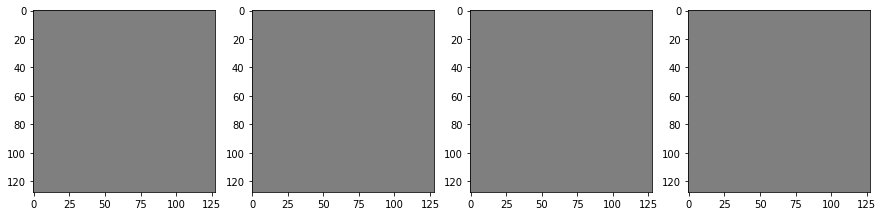

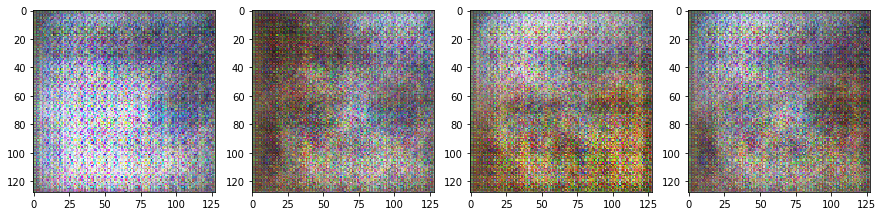

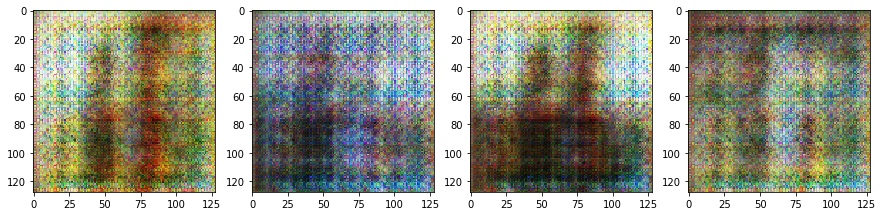

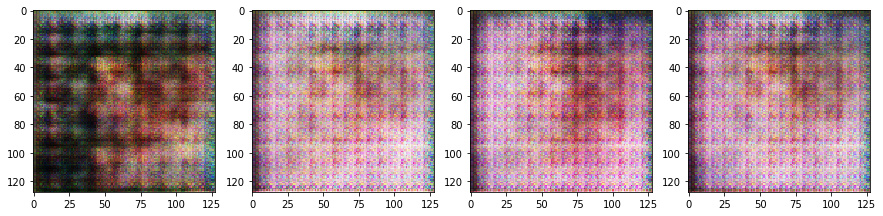

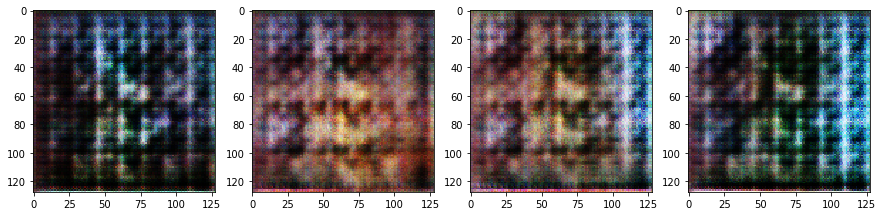

...

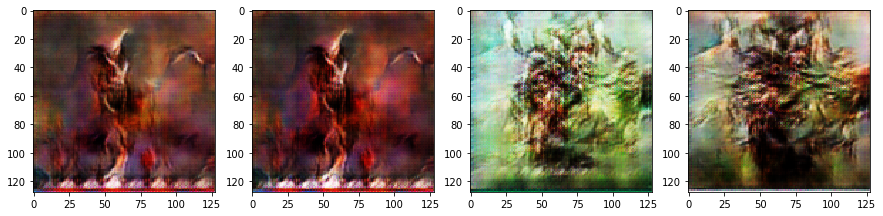

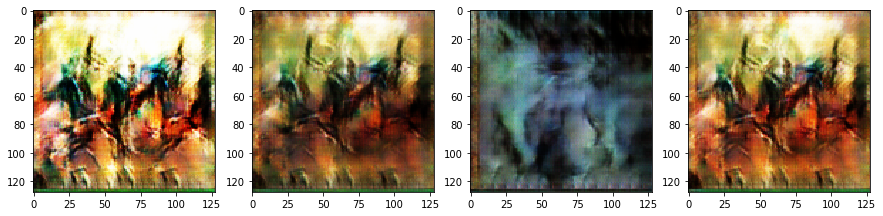

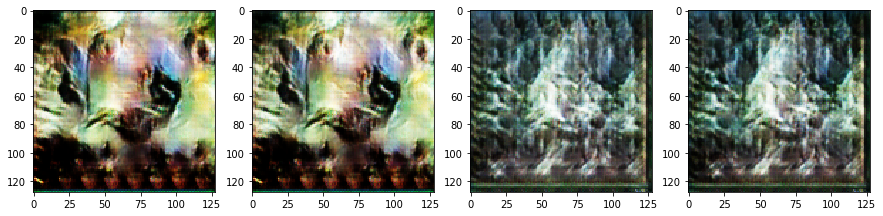

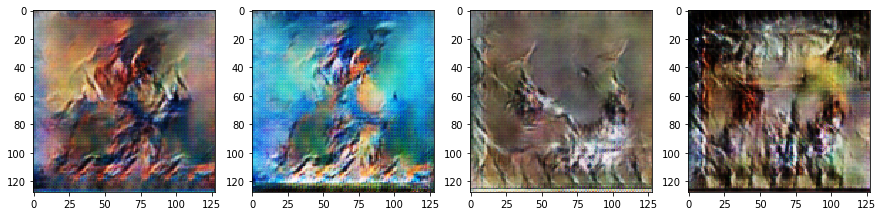

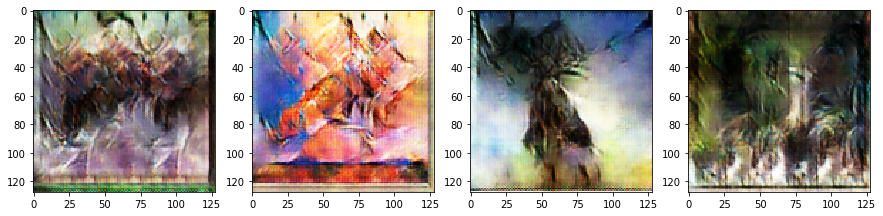

In [20]:
#tRAINING
loopits = 1
param1 = np.ones([2,loopits])
fake_samples =  np.ones([loopits,4,hrz,vrt,3])
scl = 32
handicap = 5
plotstuff = 1
flip = 1
param1[0][:] = [scl*1] #discriminator
param1[1][:] = [scl*1] #generator
genfreq = 5

samp_ind = -1
real_index = -1
fake_index = -1
d_loss_real = np.ones([loopits,epochs,2])
d_loss_fake = np.ones([loopits,epochs,2])
g_losses = np.ones([loopits,epochs,2])
similarity = np.ones([int(epochs/500)])
idx = 0
for looper in range(loopits):
    DCGAN_model = DCGAN(param1[:,looper])
    #DCGAN_model.generator.summary()
    #DCGAN_model.discriminator.summary()

    noise = np.random.normal(0,1.0, (int(batch_size),DCGAN_model.latent_dim))
    gen_imgs = DCGAN_model.generator.predict(noise)
    
    
    for epoch in range(epochs):
        #clear_output(wait=True)
        #print(looper)
        #print(epoch)
        #idx = np.random.randint(0,x_train.shape[0],int(batch_size))
        
        if idx+batch_size>x_train_small.shape[0]:
            idx = 0
        imgs = x_train_small[range(idx,idx+batch_size)]
        idx = idx+batch_size
        
        noise = np.random.normal(0,1.0, (int(batch_size),DCGAN_model.latent_dim))
        gen_imgs = DCGAN_model.generator.predict(noise)

        y_fake= np.random.uniform(0,0.1,batch_size)
        y_real = np.random.uniform(0.9,1,batch_size)
        y_true = np.ones([batch_size,1])           
        
        if flip:
            y_real= np.random.uniform(0,0.1,batch_size)
            y_fake = np.random.uniform(0.9,1,batch_size)
            y_true = np.zeros([batch_size,1])   
                  
        x_real = imgs
        x_fake = gen_imgs
        
                                        #Train on real data
        real_index = real_index+1
        x = x_real
        y = y_real
        d_loss_real[looper,real_index,:] = DCGAN_model.discriminator.train_on_batch(x,y)        

                                        #Train on fake data
        fake_index = fake_index+1
        x = x_fake
        y = y_fake
        d_loss_fake[looper,fake_index,:] = DCGAN_model.discriminator.train_on_batch(x,y)
        
        if handicap < epoch:
            for whirl in range(genfreq):
                noise = np.random.normal(0,1.0, (batch_size,DCGAN_model.latent_dim))
                g_losses[looper,epoch,:] = DCGAN_model.combined.train_on_batch(noise,y_true)
        
        if plotstuff:
            if epoch%500==0: 
                samp_ind = samp_ind+1
                print(epoch)
                for sample in range(4):

                    noise = np.random.normal(0,1.0, size=[batch_size,DCGAN_model.latent_dim])
                    images_good_fake = DCGAN_model.generator.predict(noise)
                    fake_sample = (np.squeeze(images_good_fake[1,:,:,:]))  
                    fake_samples[looper,sample,:,:,:] = fake_sample
                fake_samples_scaled = (fake_samples+1)/2

                width = 15
                height = 15
                fig = plt.figure(figsize=(width,height))
                plt.subplot(1,4,1)
                plt.imshow(fake_samples_scaled[0,0,:,:])
                plt.subplot(1,4,2)
                plt.imshow(fake_samples_scaled[0,1,:,:])
                plt.subplot(1,4,3)
                plt.imshow(fake_samples_scaled[0,2,:,:])
                plt.subplot(1,4,4)
                plt.imshow(fake_samples_scaled[0,3,:,:])
                
                rdiff = np.ones([hrz*vrt])
                gdiff = np.ones([hrz*vrt])
                bdiff = np.ones([hrz*vrt])
                rabsdiff= np.ones([4])
                gabsdiff= np.ones([4])
                babsdiff= np.ones([4])
                for sample_in in range(4):
                    intgr = 0
                    for xax in range(hrz):
                        for yax in range(vrt):
                            rdiff[intgr] = fake_samples_scaled[0,0,xax,yax,0]-fake_samples_scaled[0,sample_in,xax,yax,0]
                            gdiff[intgr] = fake_samples_scaled[0,0,xax,yax,1]-fake_samples_scaled[0,sample_in,xax,yax,1]
                            bdiff[intgr] = fake_samples_scaled[0,0,xax,yax,2]-fake_samples_scaled[0,sample_in,xax,yax,2]
                            intgr = intgr+1
                    rabsdiff[sample_in] = 1-np.mean(abs(rdiff))
                    gabsdiff[sample_in] = 1-np.mean(abs(gdiff))
                    babsdiff[sample_in] = 1-np.mean(abs(bdiff))
                    
                similarity[samp_ind] = np.mean([rabsdiff,gabsdiff,babsdiff])
                print("similarity:",np.mean([rabsdiff,gabsdiff,babsdiff]))
                print("generator_loss:",g_losses[looper,epoch,0])

In [26]:
for sample in range(4):

    noise = np.random.normal(0,1.0, size=[batch_size,DCGAN_model.latent_dim])
    images_good_fake = DCGAN_model.generator.predict(noise)
    fake_sample = (np.squeeze(images_good_fake[1,:,:,:]))  
    fake_samples[looper,sample,:,:,:] = fake_sample


rdiff = np.ones([hrz*vrt])
gdiff = np.ones([hrz*vrt])
bdiff = np.ones([hrz*vrt])
rabsdiff= np.ones([4])
gabsdiff= np.ones([4])
babsdiff= np.ones([4])
for sample_in in range(4):
    intgr = 0
    for xax in range(hrz):
        for yax in range(vrt):
            rdiff[intgr] = fake_samples[0,0,xax,yax,0]-fake_samples[0,sample_in,xax,yax,0]
            gdiff[intgr] = fake_samples[0,0,xax,yax,1]-fake_samples[0,sample_in,xax,yax,1]
            bdiff[intgr] = fake_samples[0,0,xax,yax,2]-fake_samples[0,sample_in,xax,yax,2]
            intgr = intgr+1
    rabsdiff[sample_in] = 1-np.mean(abs(rdiff))
    gabsdiff[sample_in] = 1-np.mean(abs(gdiff))
    babsdiff[sample_in] = 1-np.mean(abs(bdiff))

width = 15
height = 15
plt.figure(figsize=(width,height))
scale = 1;
plotcounter = 1;

noise = np.random.uniform(0,1.0, size=[batch_size,DCGAN_model.latent_dim])

fake_samples_scaled = (fake_samples+1)/2

for looper in range(loopits):
 
    plt.subplot(loopits,4,plotcounter)
    plt.imshow(fake_samples_scaled[looper,0,:,:])
    plt.subplot(loopits,4,plotcounter+1)
    plt.imshow(fake_samples_scaled[looper,1,:,:])
    plt.subplot(loopits,4,plotcounter+2)
    plt.imshow(fake_samples_scaled[looper,2,:,:])
    plt.subplot(loopits,4,plotcounter+3)
    plt.imshow(fake_samples_scaled[looper,3,:,:])
    plotcounter = plotcounter+4
print(np.mean([rabsdiff,gabsdiff,babsdiff]))  
print(rabsdiff)
print(gabsdiff)
print(babsdiff)

FailedPreconditionError: Attempting to use uninitialized value conv2d_transpose_20/kernel
	 [[Node: conv2d_transpose_20/kernel/read = Identity[T=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:GPU:0"](conv2d_transpose_20/kernel)]]
	 [[Node: conv2d_transpose_17/stack/_43 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_386_conv2d_transpose_17/stack", tensor_type=DT_INT32, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]

Caused by op 'conv2d_transpose_20/kernel/read', defined at:
  File "/usr/lib/python3.4/runpy.py", line 170, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.4/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.4/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.4/dist-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/usr/local/lib/python3.4/dist-packages/ipykernel/kernelapp.py", line 477, in start
    ioloop.IOLoop.instance().start()
  File "/usr/lib/python3/dist-packages/zmq/eventloop/ioloop.py", line 160, in start
    super(ZMQIOLoop, self).start()
  File "/usr/local/lib/python3.4/dist-packages/tornado/ioloop.py", line 888, in start
    handler_func(fd_obj, events)
  File "/usr/local/lib/python3.4/dist-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/lib/python3/dist-packages/zmq/eventloop/zmqstream.py", line 433, in _handle_events
    self._handle_recv()
  File "/usr/lib/python3/dist-packages/zmq/eventloop/zmqstream.py", line 465, in _handle_recv
    self._run_callback(callback, msg)
  File "/usr/lib/python3/dist-packages/zmq/eventloop/zmqstream.py", line 407, in _run_callback
    callback(*args, **kwargs)
  File "/usr/local/lib/python3.4/dist-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.4/dist-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/usr/local/lib/python3.4/dist-packages/ipykernel/kernelbase.py", line 235, in dispatch_shell
    handler(stream, idents, msg)
  File "/usr/local/lib/python3.4/dist-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/usr/local/lib/python3.4/dist-packages/ipykernel/ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/usr/local/lib/python3.4/dist-packages/ipykernel/zmqshell.py", line 533, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/usr/local/lib/python3.4/dist-packages/IPython/core/interactiveshell.py", line 2728, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/usr/local/lib/python3.4/dist-packages/IPython/core/interactiveshell.py", line 2850, in run_ast_nodes
    if self.run_code(code, result):
  File "/usr/local/lib/python3.4/dist-packages/IPython/core/interactiveshell.py", line 2910, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-20-74f3acfc4a90>", line 22, in <module>
    DCGAN_model = DCGAN(param1[:,looper])
  File "<ipython-input-18-b0fd6c7fcb66>", line 20, in __init__
    self.generator = self.build_generator(int(param[1]))
  File "<ipython-input-18-b0fd6c7fcb66>", line 124, in build_generator
    generator_model.add(Conv2DTranspose(self.channels,kernel_size = 5, strides = 2, padding ='same'))
  File "/usr/local/lib/python3.4/dist-packages/keras/models.py", line 489, in add
    output_tensor = layer(self.outputs[0])
  File "/usr/local/lib/python3.4/dist-packages/keras/engine/topology.py", line 576, in __call__
    self.build(input_shapes[0])
  File "/usr/local/lib/python3.4/dist-packages/keras/layers/convolutional.py", line 731, in build
    constraint=self.kernel_constraint)
  File "/usr/local/lib/python3.4/dist-packages/keras/legacy/interfaces.py", line 87, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.4/dist-packages/keras/engine/topology.py", line 400, in add_weight
    constraint=constraint)
  File "/usr/local/lib/python3.4/dist-packages/keras/backend/tensorflow_backend.py", line 385, in variable
    v = tf.Variable(value, dtype=tf.as_dtype(dtype), name=name)
  File "/usr/local/lib/python3.4/dist-packages/tensorflow/python/ops/variables.py", line 235, in __init__
    constraint=constraint)
  File "/usr/local/lib/python3.4/dist-packages/tensorflow/python/ops/variables.py", line 397, in _init_from_args
    self._snapshot = array_ops.identity(self._variable, name="read")
  File "/usr/local/lib/python3.4/dist-packages/tensorflow/python/ops/array_ops.py", line 142, in identity
    return gen_array_ops.identity(input, name=name)
  File "/usr/local/lib/python3.4/dist-packages/tensorflow/python/ops/gen_array_ops.py", line 3187, in identity
    "Identity", input=input, name=name)
  File "/usr/local/lib/python3.4/dist-packages/tensorflow/python/framework/op_def_library.py", line 787, in _apply_op_helper
    op_def=op_def)
  File "/usr/local/lib/python3.4/dist-packages/tensorflow/python/framework/ops.py", line 3392, in create_op
    op_def=op_def)
  File "/usr/local/lib/python3.4/dist-packages/tensorflow/python/framework/ops.py", line 1718, in __init__
    self._traceback = self._graph._extract_stack()  # pylint: disable=protected-access

FailedPreconditionError (see above for traceback): Attempting to use uninitialized value conv2d_transpose_20/kernel
	 [[Node: conv2d_transpose_20/kernel/read = Identity[T=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:GPU:0"](conv2d_transpose_20/kernel)]]
	 [[Node: conv2d_transpose_17/stack/_43 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_386_conv2d_transpose_17/stack", tensor_type=DT_INT32, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]


In [23]:
d_loss_real_plot = np.swapaxes(d_loss_real,0,1)
d_loss_fake_plot = np.swapaxes(d_loss_fake,0,1)
g_losses_plot = np.swapaxes(g_losses,0,1)

(25000,)


/usr/local/lib/python3.4/dist-packages/scipy/signal/signaltools.py:2223: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/usr/local/lib/python3.4/dist-packages/scipy/signal/signaltools.py:2225: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/usr/local/lib/python3.4/dist-packages/scipy/signal/signaltools.py:2233: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(s

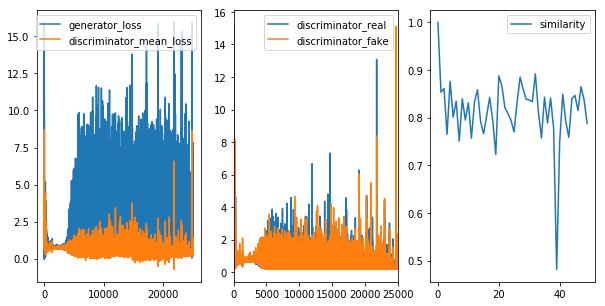

In [24]:
d_mean_loss_plot = (d_loss_real_plot[:,0,0]+d_loss_fake_plot[:,0,0])/2
d_mean_loss_plot = d_mean_loss_plot[1:real_index]
width = 10
height = 5
plt.figure(figsize=(width,height))
plt.subplot(1,3,1)
plt.plot(g_losses_plot[:,0,0],label='generator_loss')
d_mean_inter = scp.signal.resample(d_mean_loss_plot,epochs)
print(d_mean_inter.shape)
plt.plot(d_mean_inter,label='discriminator_mean_loss')
plt.legend()
plt.subplot(1,3,2)
plt.plot(d_loss_real_plot[:,0,0] ,label='discriminator_real')
plt.plot(d_loss_fake_plot[:,0,0] ,label='discriminator_fake')
plt.xlim((0,real_index))
#plt.ylim((0,1))
plt.legend()
plt.subplot(1,3,3)
plt.plot(similarity ,label='similarity')
plt.legend()

In [25]:
scipy.misc.toimage(fake_samples_scaled[0,0,:,:],cmin=0.0,cmax=1).save('im1.jpg')

/usr/local/lib/python3.4/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
  """Entry point for launching an IPython kernel.
